In [1]:
# core
import sys
import time
from datetime import timedelta

# internal
sys.path.append('../code/poloniex')
sys.path.append('../code')
import polo_eda as pe
import calc_TA_sigs as cts
import data_processing as dp

# installed
import tensorflow as tf
import pandas as pd
import numpy as np

# plotting
import matplotlib.pyplot as plt
%matplotlib inline
import plotly
plotly.offline.init_notebook_mode()
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.graph_objs import Scatter, Figure, Layout, Candlestick
from plotly.tools import FigureFactory as FF
import plotly.graph_objs as go

In [2]:
df = pe.read_trade_hist('BTC_AMP')

In [3]:
rs = dp.resample_ohlc(df)

In [4]:
sc_df, scalers = dp.transform_data(rs)

In [5]:
start = time.time()
feats, targs = dp.create_hist_feats(sc_df.iloc[-10000:])
end = time.time()
print('took', str(int(end - start)), 'seconds')

took 5 seconds


In [6]:
targs.shape

(9695, 1)

In [7]:
feats.shape

(9695, 300, 5)

In [8]:
train_feats = feats[:-1000]
train_targs = targs[:-1000]

In [9]:
def data_input(feats):
    """
    Return a Tensor for a batch of data input
    :param feat: a single feature from the features array
    :returns: Tensor placeholder for image input.
    """
    return tf.placeholder(tf.float32, [None, *feats.shape[1:]], name='input')


def data_target():
    """
    Return a Tensor for output
    :returns: Tensor for label input.
    """
    # DONE: Implement Function
    return tf.placeholder(tf.float32, shape=(None, 1), name='target')


def keep_prob_input():
    """
    Return a Tensor for keep probability
    : return: Tensor for keep probability.
    """
    # DONE: Implement Function
    keep_prob = tf.placeholder(tf.float32, name='keep_prob')
    return keep_prob

In [10]:
def fully_conn(x_tensor, num_outputs):
    """
    Apply a fully connected layer to x_tensor using weight and bias
    : x_tensor: A 2-D tensor where the first dimension is batch size.
    : num_outputs: The number of output that the new tensor should be.
    : return: A 2-D tensor where the second dimension is num_outputs.
    """
    return tf.contrib.layers.fully_connected(x_tensor, num_outputs)

In [11]:
def make_batches(feats, targs, batchsize=32):
    f_batches = []
    t_batches = []
    num_batches = int(targs.shape[0] / batchsize)
    print('num_batches:', num_batches)
    print('leftovers:', targs.shape[0] - batchsize*num_batches)
    for i in range(num_batches):
        start_idx = i * batchsize
        end_idx = start_idx + batchsize
        f_batches.append(feats[start_idx:end_idx])
        t_batches.append(targs[start_idx:end_idx])
    
    print(i)
    f_batches.append(feats[end_idx:])
    t_batches.append(targs[end_idx:])
    f_batches = np.array(f_batches)
    t_batches = np.array(t_batches)
    
    return f_batches, t_batches

In [12]:
def simple_net(x, keep_prob):
    flat = tf.contrib.layers.flatten(x)
    fc1 = fully_conn(flat, 500)
    drop1 = tf.nn.dropout(fc1, keep_prob)
    out = tf.layers.dense(drop1, 1)  # need a linear activation on the output to work
    return out

In [13]:
# hyperparameters
epochs = 15
batch_size = 32
keep_probability = 0.5

In [14]:
# Remove previous weights, bias, inputs, etc..
tf.reset_default_graph()

# Inputs
x = data_input(feats)
y = data_target()
keep_prob = keep_prob_input()

# Model
pred = simple_net(x, keep_prob)

# Name predictions Tensor, so that is can be loaded from disk after training
pred = tf.identity(pred, name='predictions')

# Loss and Optimizer
mse = tf.losses.mean_squared_error(pred, y)
loss = tf.reduce_mean(mse, name='mse_mean')
tf.summary.scalar('loss', loss)
optimizer = tf.train.AdamOptimizer().minimize(loss)

In [15]:
def train_neural_network(session, optimizer, keep_probability, feature_batch, label_batch):
    """
    Optimize the session on a batch of images and labels
    : session: Current TensorFlow session
    : optimizer: TensorFlow optimizer function
    : keep_probability: keep probability
    : feature_batch: Batch of Numpy image data
    : label_batch: Batch of Numpy label data
    """
    # DONE: Implement Function
    # tf.initialize_all_variables() 
    session.run(optimizer, 
                feed_dict={x: feature_batch, y: label_batch, keep_prob: keep_probability})

In [16]:
def print_stats(session, feature_batch, label_batch, mse):
    """
    Print information about loss and validation accuracy
    : session: Current TensorFlow session
    : feature_batch: Batch of Numpy image data
    : label_batch: Batch of Numpy label data
    : cost: TensorFlow cost function
    : accuracy: TensorFlow accuracy function
    """
    # DONE: Implement Function
    
    # keep probability of 1.0 to calculate the loss and validation accuracy
    loss = session.run(mse, feed_dict={x: feature_batch, y: label_batch, keep_prob: 1.})
    # global variables valid_features and valid_labels to calculate validation accuracy
#     val_loss = session.run(accuracy, feed_dict={x: valid_features, y: valid_labels, keep_prob: 1.})

    print('loss = {0}'.format(loss))

In [17]:
save_model_path = './simple_model'

sess = tf.Session()

# Initializing the variables
sess.run(tf.global_variables_initializer())
# IMPORTANT! only train on 90% of data
f_batches, t_batches = make_batches(train_feats, train_targs, batch_size)
# Training cycle
for epoch in range(epochs):
    # Loop over all batches
    for batch_features, batch_labels in zip(f_batches, t_batches):
        train_neural_network(sess, optimizer, keep_probability, batch_features, batch_labels)
    print('Epoch {:>2}:  '.format(epoch + 1), end='')
    print_stats(sess, batch_features, batch_labels, mse)

# Save Model
saver = tf.train.Saver()
save_path = saver.save(sess, save_model_path)

num_batches: 271
leftovers: 23
270
Epoch  1:  loss = 0.19417789578437805
Epoch  2:  loss = 0.04061979800462723
Epoch  3:  loss = 0.03794002905488014
Epoch  4:  loss = 0.034078970551490784
Epoch  5:  loss = 0.03389256075024605
Epoch  6:  loss = 0.03249771520495415
Epoch  7:  loss = 0.03536127135157585
Epoch  8:  loss = 0.034215446561574936
Epoch  9:  loss = 0.03127860650420189
Epoch 10:  loss = 0.02455497905611992
Epoch 11:  loss = 0.02453896775841713
Epoch 12:  loss = 0.02287966012954712
Epoch 13:  loss = 0.017261311411857605
Epoch 14:  loss = 0.039849378168582916
Epoch 15:  loss = 0.018142763525247574


In [18]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [19]:
preds.shape

(9695, 1)

In [20]:
preds.sum()

-1351.1157

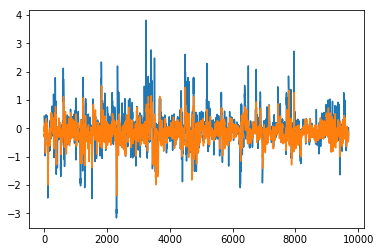

In [21]:
plt.plot(targs)
plt.plot(preds)

In [22]:
orig = dp.reform_data(rs, sc_df, scalers)

In [23]:
targ_df = pd.DataFrame({'close': targs.flatten()})
pred_df = pd.DataFrame({'close': preds.flatten()})

In [24]:
targ_df.shape

(9695, 1)

In [25]:
resc_targs = dp.reform_data(rs[-9695:], targ_df, scalers)
resc_preds = dp.reform_data(rs[-9695:], pred_df, scalers)

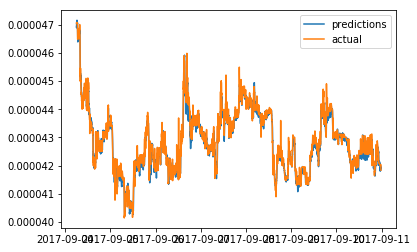

In [26]:
plt.plot(resc_preds, label='predictions')
plt.plot(rs['close'][-9695:], label='actual')
plt.legend()

In [27]:
data = [go.Scatter(x=rs[-9695:].index, y=resc_targs.close, name='actual'),
       go.Scatter(x=rs[-9695:].index, y=resc_preds.close, name='predictions')]
iplot(data)

In [28]:
diff = rs['close'][-9695:] - resc_preds['close'].values
diff_pct = (rs['close'][-9695:] - resc_preds['close'].values) / rs['close'][-9695:]

In [29]:
diff_pct.shape

(9695,)

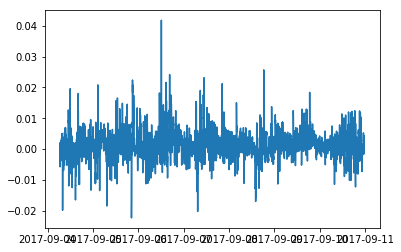

In [30]:
plt.plot(diff_pct[30:])

# ok, so it does pretty well predicting 5 timesteps ahead... how about something a bit further out, like 3 hours, or 180 timesteps?

In [31]:
start = time.time()
feats, targs = dp.create_hist_feats(sc_df.iloc[-10000:], future=180)
end = time.time()
print('took', str(int(end - start)), 'seconds')

took 5 seconds


In [32]:
train_feats = feats[:-1000]
train_targs = targs[:-1000]

In [33]:
epochs = 13

In [34]:
save_model_path = './simple_model'

sess = tf.Session()

# Initializing the variables
sess.run(tf.global_variables_initializer())
# IMPORTANT! only train on 90% of data
f_batches, t_batches = make_batches(train_feats, train_targs, batch_size)
# Training cycle
for epoch in range(epochs):
    # Loop over all batches
    for batch_features, batch_labels in zip(f_batches, t_batches):
        train_neural_network(sess, optimizer, keep_probability, batch_features, batch_labels)
    print('Epoch {:>2}:  '.format(epoch + 1), end='')
    print_stats(sess, batch_features, batch_labels, mse)

# Save Model
saver = tf.train.Saver()
save_path = saver.save(sess, save_model_path)

num_batches: 266
leftovers: 8
265
Epoch  1:  loss = 0.3067714273929596
Epoch  2:  loss = 0.09917640686035156
Epoch  3:  loss = 0.059899602085351944
Epoch  4:  loss = 0.039227865636348724
Epoch  5:  loss = 0.032150063663721085
Epoch  6:  loss = 0.029453599825501442
Epoch  7:  loss = 0.028072291985154152
Epoch  8:  loss = 0.027702268213033676
Epoch  9:  loss = 0.03034864366054535
Epoch 10:  loss = 0.027120742946863174
Epoch 11:  loss = 0.035186056047677994
Epoch 12:  loss = 0.031221158802509308
Epoch 13:  loss = 0.07059456408023834


In [35]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [36]:
targ_df = pd.DataFrame({'close': targs.flatten()})
pred_df = pd.DataFrame({'close': preds.flatten()})

In [37]:
resc_targs = dp.reform_data(rs[-9520:], targ_df, scalers)
resc_preds = dp.reform_data(rs[-9520:], pred_df, scalers)

In [102]:
data = [go.Scatter(x=rs[-9520:].index, y=resc_targs.close, name='actual'),
       go.Scatter(x=rs[-9520:].index, y=resc_preds.close, name='predictions')]
iplot(data)

# test out future predictions

In [39]:
feats, targs = dp.create_feats_to_current(sc_df.iloc[-10000:], future=180)

In [40]:
preds = sess.run(pred, feed_dict={x: feats, y: targs, keep_prob: 1})

In [41]:
preds.shape

(9700, 1)

In [42]:
targs.shape

(9520, 1)

In [43]:
feats.shape

(9700, 300, 5)

In [104]:
targ_df = pd.DataFrame({'close': targs.flatten()})
resc_targs = dp.reform_data(rs[-9520:], targ_df, scalers)

In [105]:
future_preds = preds[9520:]

In [106]:
future_preds.shape

(180, 1)

In [107]:
resc_preds = dp.rescale_data(pd.DataFrame({'close': future_preds.flatten()}), scalers)

In [108]:
resc_preds.shape

(180, 1)

In [148]:
# need to check math on this part, then xfer into dp...still not working

def reform_prediction(df, prediction, mva=30):
    """
    :param df: a pandas dataframe of the known data.  This should be the natural data,
                not scaled or normalized
    :param prediction: rescaled
    """
    return df.iloc[-mva + 1:].close.sum() / (mva - prediction)


def reform_future_predictions(df, preds, mva=30):
    """
    rescales future predictions
    :param df: pandas dataframe of current data, up to most recent timestep before future predictions
    :param preds: numpy array of predictions, with shape (x,)
    :param mva: integeter specifying moving average period (same as used for scaling the data)
    """
    resc_preds = [reform_prediction(df, preds[0], mva=mva)]
    for i in range(1, mva - 1):
        print(-mva + i + 1, i)
        cur = (df.iloc[-mva + i + 1:].close.sum() + sum(resc_preds[:i])) / (mva - preds[i])
        resc_preds.append(cur)
    
    for i in range(mva, preds.shape[0]):
        print(-mva + i, i)
        cur = sum(resc_preds[-mva + i:i - 1]) / (mva - preds[i])
        resc_preds.append(cur)

    return pd.DataFrame({'close': resc_preds})

In [149]:
ref_future_preds = reform_future_predictions(sc_df, resc_preds.close.values)

-28 1
-27 2
-26 3
-25 4
-24 5
-23 6
-22 7
-21 8
-20 9
-19 10
-18 11
-17 12
-16 13
-15 14
-14 15
-13 16
-12 17
-11 18
-10 19
-9 20
-8 21
-7 22
-6 23
-5 24
-4 25
-3 26
-2 27
-1 28
0 30
1 31
2 32
3 33
4 34
5 35
6 36
7 37
8 38
9 39
10 40
11 41
12 42
13 43
14 44
15 45
16 46
17 47
18 48
19 49
20 50
21 51
22 52
23 53
24 54
25 55
26 56
27 57
28 58
29 59
30 60
31 61
32 62
33 63
34 64
35 65
36 66
37 67
38 68
39 69
40 70
41 71
42 72
43 73
44 74
45 75
46 76
47 77
48 78
49 79
50 80
51 81
52 82
53 83
54 84
55 85
56 86
57 87
58 88
59 89
60 90
61 91
62 92
63 93
64 94
65 95
66 96
67 97
68 98
69 99
70 100
71 101
72 102
73 103
74 104
75 105
76 106
77 107
78 108
79 109
80 110
81 111
82 112
83 113
84 114
85 115
86 116
87 117
88 118
89 119
90 120
91 121
92 122
93 123
94 124
95 125
96 126
97 127
98 128
99 129
100 130
101 131
102 132
103 133
104 134
105 135
106 136
107 137
108 138
109 139
110 140
111 141
112 142
113 143
114 144
115 145
116 146
117 147
118 148
119 149
120 150
121 151
122 152
123 153
124 154
12

In [150]:
past_preds = preds[:9520]

In [151]:
past_preds.shape

(9520, 1)

In [152]:
ref_past_preds = dp.reform_data(rs[-9520:], pd.DataFrame({'close': past_preds.flatten()}), scalers)

In [153]:
start = ref_past_preds.index[-1] + timedelta(minutes=1)

In [154]:
start

Timestamp('2017-09-10 23:38:00', freq='T')

In [155]:
ref_future_preds.shape

(179, 1)

In [156]:
future_ix = pd.DatetimeIndex(start=start, end=start + timedelta(minutes=ref_future_preds.shape[0] - 1), freq='T')

In [157]:
future_ix.shape

(179,)

In [158]:
ref_future_preds.set_index(future_ix, inplace=True)

In [159]:
data = [go.Scatter(x=rs[-9520:].index, y=resc_targs.close, name='actual'),
       go.Scatter(x=rs[-9520:].index, y=ref_past_preds.close, name='predictions'),
       go.Scatter(x=ref_future_preds.index, y=ref_future_preds.close, name='future predictions')]
iplot(data)